In [37]:
from tensorflow.keras.models import load_model
from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2


In [2]:
# os.chdir('/Users/sonerkoc/Git_repos/tumor-bud-detection')

In [38]:
parameters_dict = {
    'data_folder':"/sbgenomics/project-files/DATASET_BUD/test/",
    'test_size': 10,
    'IMG_HEIGHT': 512,
    'IMG_WIDTH': 512,
    'IMG_CHANNELS': 3,
    'sample_count': 10,
    'output_folder': '.',
    'trained_model': 'models/batch_size-16_epoch-100_model_no-1_cuda_no-0_model_name-test_learning_rate-0.001_size_img-512_scale_factor-1_main_modelCheckpoint.h5'
}

In [39]:
path = parameters_dict['data_folder'] + "img/"
path_mask = parameters_dict['data_folder']  + "mask/"

total = int(sum([len(files) for r, d, files in os.walk(path)]))

_, _, lst_img = next(os.walk(path))
_, _, lst_mask = next(os.walk(path_mask))

print(f'Number of Test Samples Image: {len(lst_img)}\t Mask: {len(lst_mask)}')
parameters_dict['sample_count'] = total

Number of Test Samples Image: 26	 Mask: 26


In [40]:
IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS = parameters_dict['IMG_HEIGHT'], parameters_dict['IMG_WIDTH'], parameters_dict['IMG_CHANNELS']
count = parameters_dict['sample_count']

X_test = np.ndarray((total, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.float32)
Y_test = np.ndarray((total, IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.float32)

for i, f in enumerate(lst_img[:count]):
    img = cv2.imread(path + f)
    img = cv2.resize(img, (IMG_HEIGHT, IMG_WIDTH), interpolation=cv2.INTER_AREA)
    img = img / 255
    X_test[i] = img

for i, fm in enumerate(lst_mask[:count]):
    img_mask = cv2.imread(path_mask + fm, cv2.IMREAD_GRAYSCALE)
    img_mask = cv2.resize(img_mask, (IMG_HEIGHT, IMG_WIDTH), interpolation=cv2.INTER_AREA)
    img_mask = img_mask / 255
    img_mask = np.expand_dims(img_mask, axis=-1)
    Y_test[i] = img_mask
print(f'X_test shape: {X_test.shape}\t Y_test shape: {Y_test.shape}')

X_test shape: (26, 512, 512, 3)	 Y_test shape: (26, 512, 512, 1)


# Load Model

In [41]:
# Loss Function
smooth=1.
def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f*y_true_f) + K.sum(y_pred_f*y_pred_f) + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1.-dice_coef(y_true, y_pred)

In [42]:
# load model
model = load_model(parameters_dict['trained_model'], custom_objects={'dice_coef':dice_coef, 'dice_coef_loss':dice_coef_loss})


In [43]:
# check prediction
preds_test = model.predict(X_test)

In [44]:
preds_test.shape

(26, 262144, 1)

In [45]:
preds_reshaped = np.ndarray((len(preds_test), IMG_HEIGHT, IMG_WIDTH), dtype=np.float32)
for i in range(len(preds_test)):
    preds_reshaped[i] = preds_test[i].reshape(IMG_HEIGHT, IMG_WIDTH)

preds_upsampled = []
for i in range(len(preds_test)):
    preds_upsampled.append(np.expand_dims(cv2.resize(preds_reshaped[i], (IMG_HEIGHT, IMG_WIDTH)), axis=-1))
print("[INFO] Upsampling is done!(upsampled to ({}, {}) from ({}, {})".format(IMG_HEIGHT, IMG_WIDTH, preds_test[i].shape[0], preds_test[i].shape[1]))

[INFO] Upsampling is done!(upsampled to (512, 512) from (262144, 1)


In [46]:
output_pred = os.path.join(parameters_dict['output_folder'], 'Prediction')
if not os.path.exists(output_pred): os.mkdir(output_pred)
theshold_pred = 0.5

for k in range(parameters_dict['sample_count']):
    img_mask = np.zeros((IMG_HEIGHT, IMG_WIDTH))
    img = preds_upsampled[k].copy()

    img[ img > theshold_pred] = 1
    img[ img <= theshold_pred] = 0
    img *= 255
    
    out_name = os.path.join(output_pred, "pred-" + lst_img[k])
    cv2.imwrite(out_name, img)
    
print('[INFO] Finished Prediction!')

[INFO] Finished Prediction!


# Visualization

In [47]:
import os
import cv2
# os.chdir('/Users/sonerkoc/Git_repos/tumor-bud-detection')

from utils import *

In [48]:
def read_image(file, mask=False, IMG_HEIGHT=parameters_dict['IMG_HEIGHT'], IMG_WIDTH=parameters_dict['IMG_WIDTH']):
    if not mask:
        img = cv2.imread(file, cv2.IMREAD_COLOR)
        img = cv2.resize(img, (IMG_HEIGHT, IMG_WIDTH), interpolation=cv2.INTER_AREA)
        return img
    else:
        img_mask = cv2.imread(file, cv2.IMREAD_GRAYSCALE)
        img_mask = cv2.resize(img_mask, (IMG_HEIGHT, IMG_WIDTH), interpolation=cv2.INTER_AREA)
        img_mask = np.expand_dims(img_mask, axis=-1)
        return img_mask

In [14]:
def rename_orj(dir_img, id):
    '''
    Rename Orj Img files for easy convertion
    '''
    for f in os.listdir(dir_img):
        lst_f = [s.strip("0") for s in f.split('-')]
        name_new = 'orj-' + '-'.join([str(id)]+lst_f)
        os.rename(os.path.join(dir_img, f), os.path.join(dir_img, name_new))

In [27]:
import numpy as np
import os
import matplotlib.pyplot as plt
from utils import *
import time

def generate_visuals(dir_img, dir_pred, img_count=1, clean=True):

    # list all files in dir
    files = [f for f in os.listdir(os.path.join(dir_img, 'img'))]

    # select 0.1 of the files randomly 
    random_files = np.random.choice(files, img_count)
    
    # Write Generated Visualization
    dir_write = 'Visualization'
    if not os.path.exists(dir_write):
        os.makedirs(dir_write)
    
    for i, file in enumerate(random_files):
    
        sample_img = os.path.join(dir_img, 'img', file)
        file_name = ('-'.join(file.split('-')[1:])).split('.')[0]
        
        print(file)
        sample_ann = os.path.join(dir_img, 'ann', 'ann-'+file_name+'.jpg')
        sample_pred = os.path.join(dir_pred, 'pred-'+file)
        sample_mask = os.path.join(dir_img, 'mask', 'bw-'+file_name+'.png')
        
        if not os.path.exists(sample_ann): continue
        fig, axes = plt.subplots(1, 4, figsize=(72, 72))
        ax = axes.flatten()

        orj_img = cv2.imread(sample_img,cv2.IMREAD_COLOR)
        ann_img = cv2.imread(sample_ann, cv2.IMREAD_COLOR)
        mask_img  = cv2.imread(sample_mask, cv2.IMREAD_GRAYSCALE)
        pred_img = cv2.imread(sample_pred, cv2.IMREAD_GRAYSCALE)
        overlap_img = mapperImage(img_ann=read_image(sample_ann), img_pred=read_image(sample_pred, mask=True),\
                                  fname="overlap-"+file, output_dir='.', clean=clean)

        # select only masked area below
        # masked = input_img.copy()
        # masked[mask_img == 0 ] = 0
        if os.path.exists(sample_ann):
            
            ax[0].imshow(ann_img)
            ax[0].set_axis_off()
            ax[0].set_title("Ann Image", fontsize=60)

            ax[2].imshow(mask_img, cmap="gray")
            ax[2].set_axis_off()
            ax[2].set_title("Mask", fontsize=60)

            ax[1].imshow(overlap_img)
            ax[1].set_axis_off()
            ax[1].set_title("Overlap Image", fontsize=60)

            ax[3].imshow(pred_img, cmap="gray")
            ax[3].set_axis_off()
            ax[3].set_title("Predicted", fontsize=60)
            
            plt.savefig(os.path.join(dir_write, 'visual-generated-'+file))
            

orj-1308-39-100.jpg
[makeItClean] Num of contours after MORPH_OPEN: 1
orj-1308-35-95.jpg
[makeItClean] Num of contours after MORPH_OPEN: 4
orj-1308-37-97.jpg
[makeItClean] Num of contours after MORPH_OPEN: 2
orj-1308-36-75.jpg
[makeItClean] Num of contours after MORPH_OPEN: 3
orj-1308-36-76.jpg
[makeItClean] Num of contours after MORPH_OPEN: 2


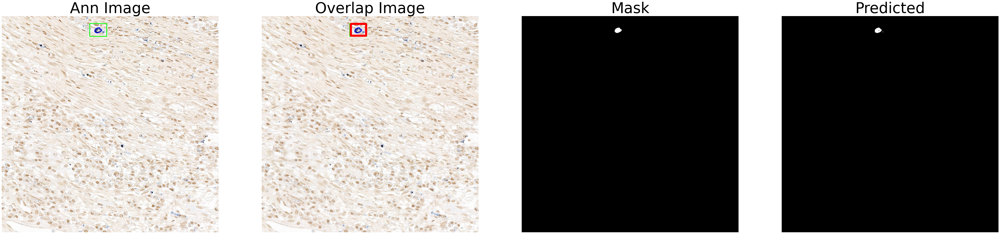

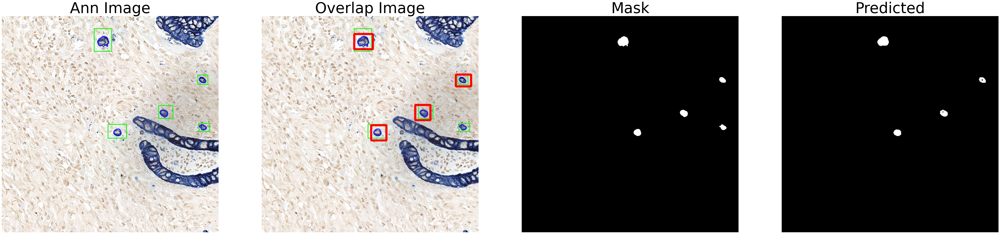

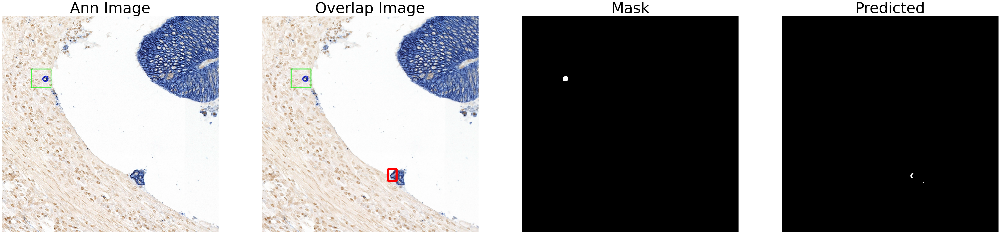

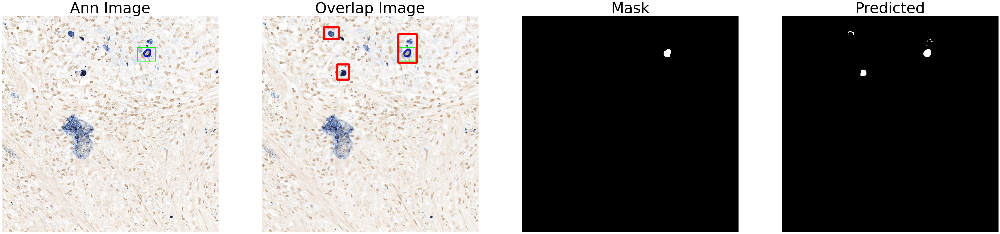

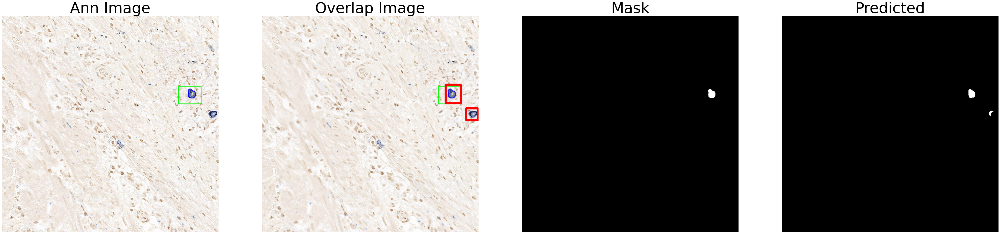

In [28]:
for i in range(5):
    generate_visuals(parameters_dict['data_folder'], 'Prediction/')
    time.sleep(3)

# Test IoU Metric for Eval

In [24]:
import numpy as np

EPS = 1e-12


def get_iou(gt, pr, n_classes):
    class_wise = np.zeros(n_classes)
    for cl in range(n_classes):
        intersection = np.sum((gt == cl)*(pr == cl))
        union = np.sum(np.maximum((gt == cl), (pr == cl)))
        iou = float(intersection)/(union + EPS)
        class_wise[cl] = iou
    return class_wise

In [36]:
sample_mask = "/sbgenomics/project-files/DATASET_BUD/test/mask/bw-1308-34-96.png"
sample_pred = "Prediction/pred-orj-1308-34-96.jpg"


mask_img = read_image(sample_mask)
pred_img = read_image(sample_pred, mask=True)





array([0.99938109])

In [41]:
('pred-orj-123-12-12.jpg'.split('.')[0]).split('-')[-3:] == ('13-12-12.jpg'.split('.')[0]).split('-')[-3:]

False

In [1]:
from collections import defaultdict

In [35]:
def eval_iou_per_bud(dir_ground, dir_pred, thold_area=100):
    
    dict_eval = {'tp':0,
                 'fp':0,
                 'fn':0,
                 'tn':0,
                 'f1':0}
    
    _, _ , files_ground = next(os.walk(dir_ground))
    _, _ , files_pred = next(os.walk(dir_pred))

    files_ground = sorted(files_ground)
    files_pred = sorted(files_pred)
    
    assert (len(files_ground) == len(files_pred)), print(f'[eval_iou_per_bud] WARNING! Unequal number of files in mask and img folders! {len(files_ground)} vs {len(files_pred)}')
    
    for i, file in enumerate(files_ground):
        
        fname_ground = files_ground[i]
        fname_pred = files_pred[i]
        
        # debug
        dict_locs = defaultdict(list)
        
        ids_in_ground = (fname_ground.split('.')[0]).split('-')[-3:]
        ids_in_pred = (fname_pred.split('.')[0]).split('-')[-3:]
        
        assert(ids_in_ground == ids_in_pred), print(f'[eval_iou_per_bud] WARNING! File and Col-Row IDs not Match! {ids_in_ground} vs. {ids_in_pred}') 
        print(fname_ground)
        img_ground = read_image(dir_ground+fname_ground, mask=True)
        img_pred = read_image(dir_pred+fname_pred, mask=True)
        
        conts_ground, hierachy = cv2.findContours(img_ground, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        for j, cont in enumerate(conts_ground):
            x,y,w,h = cv2.boundingRect(cont)
            if w*h > thold_area:
                bud_crop_ground = img_ground[y:y+h, x:x+w]
                bud_crop_pred = img_pred[y:y+h, x:x+w]
                score_iou = get_iou(bud_crop_ground, bud_crop_pred, n_classes=1)[0]
                print(score_iou)
                dict_locs[file].append(score_iou)
    return dict_locs
#             # get the min area rect
#             rect = cv2.minAreaRect(c)
#             box = cv2.boxPoints(rect)
#             # convert all coordinates floating point values to int
#             box = np.int0(box)

In [36]:
eval_iou_per_bud('/sbgenomics/project-files/DATASET_BUD/test/mask/', 'Prediction/', thold_area=100)

bw-1296-22-90.png
0.33593749999999867
0.4551083591331255
0.26495726495726385
defaultdict(<class 'list'>, {'bw-1296-22-90.png': [0.33593749999999867, 0.4551083591331255, 0.26495726495726385]})
bw-1296-22-93.png
0.7246963562753022
0.17777777777777679
0.2142857142857129
defaultdict(<class 'list'>, {'bw-1296-22-93.png': [0.7246963562753022, 0.17777777777777679, 0.2142857142857129]})
bw-1296-23-75.png
0.330597889800703
defaultdict(<class 'list'>, {'bw-1296-23-75.png': [0.330597889800703]})
bw-1296-23-76.png
0.420168067226889
0.5673624288425037
defaultdict(<class 'list'>, {'bw-1296-23-76.png': [0.420168067226889, 0.5673624288425037]})
bw-1296-23-77.png
0.2461538461538449
0.5945945945945906
0.37362637362637224
0.5735294117646975
defaultdict(<class 'list'>, {'bw-1296-23-77.png': [0.2461538461538449, 0.5945945945945906, 0.37362637362637224, 0.5735294117646975]})
bw-1296-23-79.png
0.5137614678899071
defaultdict(<class 'list'>, {'bw-1296-23-79.png': [0.5137614678899071]})
bw-1296-23-80.png
0.2481